In [76]:
import os
import sys
import re
import numpy as np
import tensorflow as tf
import pandas as pd
import cv2
import glob
import json
import matplotlib.pyplot as plt

from collections import deque
from predictors.posepredictor import PosePredictor
seed = 1

In [3]:
with open("image_data_table.json") as image_talbe_file:
    image_data_table = json.load(image_talbe_file)

In [4]:
downsample_factor = 3
n_frames = 32
train_test_split = 0.7

In [5]:
X_train, y_train, X_test, y_test = [], [], [], []
for dataset in image_data_table["datasets"]:
    for user in dataset["users"]:
        for date in dataset["dates"]:
            for action in dataset["actions"]:
                files_path = os.path.join(
                    dataset["location"],
                    dataset["version_num"],
                    "pose",
                    user,
                    date,
                    action
                )
                times = glob.glob(os.path.join(files_path,"*"))
                for time in times:
                    time_stamp = os.path.split(time)[-1]
                    files = glob.glob(os.path.join(time,'*.csv'))
                    # create the pose deques
                    train_deque_list = []
                    for i in range(downsample_factor):
                        train_deque_list.append(deque(maxlen=n_frames))

                    # print(files)
                    for j in range(0, int(train_test_split * len(files))):
                        # load and predict on image
                        #print(file)
                        current_pose = np.genfromtxt(files[j], delimiter=",")
                        # deque index
                        index = int(j % downsample_factor)
                        # add to pose deque
                        train_deque_list[index].append(current_pose)
                        # if the deque is full then add it to the X and y
                        #print(deque_list[index])
                        if len(train_deque_list[index]) == n_frames:
                            # add file to the data lists for exploration
                            X_train.append(np.array(train_deque_list[index]))
                            y_train.append(action)
                    
                    # create the pose deques
                    test_deque_list = []
                    for i in range(downsample_factor):
                        test_deque_list.append(deque(maxlen=n_frames))

                    # print(files)
                    for j in range(int(train_test_split * len(files)), len(files)):
                        # load and predict on image
                        #print(file)
                        current_pose = np.genfromtxt(files[j], delimiter=",")
                        # deque index
                        index = int(j % downsample_factor)
                        # add to pose deque
                        test_deque_list[index].append(current_pose)
                        # if the deque is full then add it to the X and y
                        #print(deque_list[index])
                        if len(test_deque_list[index]) == n_frames:
                            # add file to the data lists for exploration
                            X_test.append(np.array(test_deque_list[index]))
                            y_test.append(action)

In [6]:
X_train = np.array(X_train)
print("X_train shape", X_train.shape)
y_train = np.array(y_train)
print("y_train shape", y_train.shape)
X_test = np.array(X_test)
print("X_test shape", X_test.shape)
y_test = np.array(y_test)
print("y_test shape", y_test.shape)

print(
    "train X ((min, min), (max, max)): ((",
    X_train[:,:,:,0].min(),", ", X_train[:,:,:,1].min(), "), (",
    X_train[:,:,:,0].max(),", ", X_train[:,:,:,1].max(), "))"
)

X_train shape (1635, 32, 17, 2)
y_train shape (1635,)
X_test shape (435, 32, 17, 2)
y_test shape (435,)
train X ((min, min), (max, max)): (( 0.6663004062518999 ,  54.58317738098857 ), ( 505.493158125228 ,  642.0337267330185 ))


In [7]:
y_df = pd.DataFrame(y_train)
y_df[0].value_counts()

squats        327
ROTS          327
rest          327
star_jumps    327
punching      327
Name: 0, dtype: int64

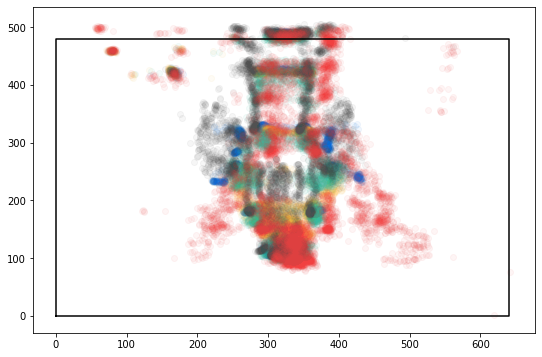

In [8]:
color_dic = {
    "rest": "#046DE0",
    "punching": "#FDBE3D",
    "ROTS": "#38B99E",
    "squats": "#515151",
    "star_jumps": "#f14040",
}
fig, ax = plt.subplots(1,1)
fig.set_size_inches((9,6))
data = X_train
for i in range(0, len(data), int(len(data)/50)):
    action = y_train[i]
    plt.scatter(data[i][:,:,1], data[i][:,:,0], c=color_dic[action], alpha=0.05 )
# ax.set_xlim((0, 640))
# ax.set_ylim((-1.1 * 48/64, 1.1* 48/64))

# draw box
ax.plot([0,0,640,640,0],[0, 480, 480, 0, 0], c='k');

In [11]:
# rescale and flip upright
image_size = np.array([480, 640])
X_train_scaled = ((X_train - 0) / (image_size.max() ))
X_test_scaled = ((X_test - 0) / (image_size.max() ))

#flip vertically
X_train_flipped = np.array(X_train_scaled)
X_train_flipped[:,:,:,0] = image_size[0]/image_size[1] - X_train_flipped[:,:,:,0]

X_test_flipped = np.array(X_test_scaled)
X_test_flipped[:,:,:,0] = image_size[0]/image_size[1] - X_test_flipped[:,:,:,0]


print(
    "train X ((min, min), (max, max)): ((",
    X_train_flipped[:,:,:,0].min(),", ", X_train_flipped[:,:,:,1].min(), "), (",
    X_train_flipped[:,:,:,0].max(),", ", X_train_flipped[:,:,:,1].max(), "))"
)

train X ((min, min), (max, max)): (( -0.03983305957066874 ,  0.08528621465779465 ), ( 0.7489589056152314 ,  1.0031776980203415 ))


In [159]:
def preprocess_ndarray(user_array: np.ndarray, image_size=np.array([480, 640])):
    user_array_scaled = ((user_array - 0) / (image_size.max() ))
    user_array_flipped = np.array(user_array_scaled)
    user_array_flipped[:,:,:,0] = image_size[0]/image_size[1] - user_array_flipped[:,:,:,0]

    def clip_dataset(data: np.ndarray, im_size=(480, 640)) -> np.ndarray:
        low_inds_y = data[:,:,:,0] < 0
        low_inds_x = data[:,:,:,1] < 0
        high_inds_y = data[:,:,:,0] > im_size[0] / (im_size[1])
        high_inds_x = data[:,:,:,1] > 1
        data[low_inds_y, 0] = 0
        data[low_inds_x, 1] = 0
        data[high_inds_y, 0] = im_size[0] / (im_size[1])
        data[high_inds_x, 1] = 1
        return data
    user_array_clipped = clip_dataset(user_array_flipped,(480, 640))

    return user_array_clipped

In [13]:
def clip_dataset(data: np.ndarray, image_size=(480, 640)) -> np.ndarray:
    low_inds_y = data[:,:,:,0] < 0
    low_inds_x = data[:,:,:,1] < 0
    high_inds_y = data[:,:,:,0] > image_size[0] / (image_size[1])
    high_inds_x = data[:,:,:,1] > 1
    data[low_inds_y, 0] = 0
    data[low_inds_x, 1] = 0
    data[high_inds_y, 0] = image_size[0] / (image_size[1])
    data[high_inds_x, 1] = 1
    return data

In [14]:
X_train_flipped = clip_dataset(X_train_flipped)
X_test_flipped = clip_dataset(X_test_flipped)

print(
    "train X ((min, min), (max, max)): ((",
    X_train_flipped[:,:,:,0].min(),", ", X_train_flipped[:,:,:,1].min(), "), (",
    X_train_flipped[:,:,:,0].max(),", ", X_train_flipped[:,:,:,1].max(), "))"
)

train X ((min, min), (max, max)): (( 0.0 ,  0.08528621465779465 ), ( 0.7489589056152314 ,  1.0 ))


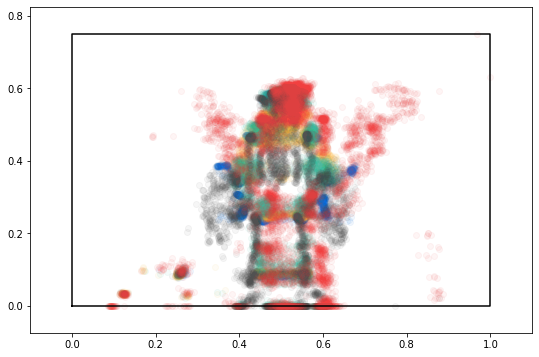

In [17]:
color_dic = {
    "rest": "#046DE0",
    "punching": "#FDBE3D",
    "ROTS": "#38B99E",
    "squats": "#515151",
    "star_jumps": "#f14040",
}
fig, ax = plt.subplots(1,1)
fig.set_size_inches((9,6))
data = X_train_flipped
for i in range(0, len(data), int(len(data)/50)):
    action = y_train[i]
    plt.scatter(data[i][:,:,1], data[i][:,:,0], c=color_dic[action], alpha=0.05 )
ax.set_xlim((-0.1,1.1))
ax.set_ylim((-0.1 * 48/64, 1.1* 48/64))

# draw box
ax.plot([0,0,1,1,0],[0, 0.75, 0.75, 0, 0], c='k');

In [36]:
# Data augementation functions

def translate_x(data: np.ndarray, dx):
    # pose points come in (y,x) pairs
    v = np.array([0, dx])
    temp = data + v
    return temp

def translate_y(data: np.ndarray, dy):
    # pose points come in (y,x) pairs
    v = np.array([dy, 0])
    temp = data + v
    return temp

def rotate_theta(data: np.ndarray, center, deg):
    # theta is the angle in degrees rotated ccw
    # pose points come in (y,x) pairs
    data = data - np.array(center)
    rot = np.array(
        [[np.cos(2 * np.pi * deg / 360), np.sin(2 * np.pi * deg / 360)],
        [-np.sin(2 * np.pi * deg / 360), np.cos(2 * np.pi * deg / 360)]]
    )
    temp = rot @ np.transpose(data, (0,2,1))
    rv = np.transpose(temp, (0,2,1)) + np.array(center)
    return rv

def reflect_horizontal(data: np.ndarray, center, flip):
    # pose points come in (y,x) pairs
    data = data - np.array(center)
    temp = np.array(data)
    if flip >= 0.5:
        temp[:,:,1] = - temp[:,:,1]
    rv = temp + np.array(center)
    return rv

def reflect_vertical(data: np.ndarray, center, flip):
    # pose points come in (y,x) pairs
    data = data - np.array(center)
    temp = np.array(data)
    if flip >= 0.5:
        temp[:,:,0] = - temp[:,:,0]
    rv = temp + np.array(center)
    return rv

def scale(data: np.ndarray, center, mag):
    data = data - np.array(center)
    temp = mag * data
    rv = temp + np.array(center)
    return rv

def test_translate_x():
    x = np.array(
        [[[1, 2], [3, 4]],
        [[5, 6], [7, 8]]]
        )
    x_translated = np.array(
        [[[1, 5], [3, 7]],
        [[5, 9], [7, 11]]]
        )
    test = translate_x(x, 3)
    assert(np.all(x_translated == test))

def test_translate_y():
    x = np.array(
        [[[1, 2], [3, 4]],
        [[5, 6], [7, 8]]]
        )
    x_translated = np.array(
        [[[5, 2], [7, 4]],
        [[9, 6], [11, 8]]]
        )
    test = translate_y(x, 4)
    assert(np.all(x_translated == test))

def test_rotate_90_degrees():
    # pose points come in (y,x) pairs
    x = np.array(
        [[[2., 3.], [4., 5.]],
        [[6., 7.], [8., 9.]]]
        )
    x_rotated = np.array(
        [[[2., -0.], [3., -2.]],
        [[7., -4.], [9., -6.]]]
        )
    test = rotate_theta(x, (1,1), 90) # 90 degrees ccw
    
    assert(np.all(x_rotated - test < 1E-6))

def test_reflect_horizontal():
    # pose points come in (y,x) pairs
    x = np.array(
        [[[2., 3.], [4., 5.]],
        [[6., 7.], [8., 9.]]]
        )
    x_reflected = np.array(
        [[[2., -1.], [4., -3.]],
        [[6., -5.], [8., -7.]]]
        )
    test = reflect_horizontal(x, (1,1), 1)
    assert(np.all(x_reflected == test))

def test_reflect_vertical():
    # pose points come in (y,x) pairs
    x = np.array(
        [[[2., 3.], [4., 5.]],
        [[6., 7.], [8., 9.]]]
        )
    x_reflected =  np.array(
        [[[-0, 3], [-2, 5]],
        [[-4, 7], [-6, 9]]]
        )
    test = reflect_vertical(x, (1,1), 1)
    
    assert(np.all(x_reflected == test))

def test_scale():
    x = np.array(
        [[[2., 3.], [4., 5.]],
        [[6., 7.], [8., 9.]]]
        )
    x_scaled = np.array(
        [[[4., 5.], [7., 9.]],
        [[11., 13.], [15., 17.]]]
        )
    test = scale(x, (1,1), 2)
    assert(np.all(x_scaled == test))

test_translate_x()
test_translate_y()
test_rotate_90_degrees()
test_reflect_horizontal()
test_reflect_vertical()

In [52]:
epochs = 40

mu_x = 0 # mean 0, 0.4*640 pixel
sig_x = 0.2 
mu_y = 0 # mean 0, 0.05*640 pixel
sig_y = 0.1
mu_rot = 0 # mean 0, std .5 deg
sig_rot = 0.5
mu_scale = 1 # mean 1, std 10%
sig_scale = 0.1

center = (image_size[0] / (2 * image_size[1]), 0.5)

X_train_augemented = []
y_train_augemented = []

# sythetic train data
data = X_train_flipped
for i in range(epochs):
    for i in range(len(data)):
        temp = data[i]
        
        low_inds_y = temp[:,:,0] <= 0
        low_inds_x = temp[:,:,1] <= 0
        high_inds_y = temp[:,:,0] >= image_size[0] / (image_size[1])
        high_inds_x = temp[:,:,1] >= 1
        
        
        x_translation_value = np.random.normal(loc=mu_x, scale=sig_x) 
        y_translation_value = np.random.normal(loc=mu_y, scale=sig_y) 
        rotation_value = np.random.normal(loc=mu_rot, scale=sig_rot) 
        h_reflection_value = np.random.uniform(0, 1)
        scale_value = np.random.normal(loc=mu_scale, scale=sig_scale) 

        temp = translate_x(temp, x_translation_value)
        temp = translate_y(temp, y_translation_value)
        temp = rotate_theta(temp, center, rotation_value)
        temp = reflect_horizontal(temp, center, h_reflection_value)
        temp = scale(temp, center, scale_value)

        temp[low_inds_y, 0] = 0
        temp[low_inds_x, 1] = 0
        temp[high_inds_y, 0] = image_size[0] / (image_size[1])
        temp[high_inds_x, 1] = 1

        X_train_augemented.append(temp)
        y_train_augemented.append(y_train[i])

X_test_augemented = []
y_test_augemented = []

# sythetic train data
data = X_test_flipped
for i in range(epochs):
    for i in range(len(data)):
        temp = data[i]

        low_inds_y = temp[:,:,0] <= 0
        low_inds_x = temp[:,:,1] <= 0
        high_inds_y = temp[:,:,0] >= image_size[0] / (image_size[1])
        high_inds_x = temp[:,:,1] >= 1

        x_translation_value = np.random.normal(loc=mu_x, scale=sig_x) # mean 0, 0.05*640 pixel
        y_translation_value = np.random.normal(loc=mu_y, scale=sig_y) # mean 0, 0.05*640 pixel
        rotation_value = np.random.normal(loc=mu_rot, scale=sig_rot) # mean 0, std .5 deg
        h_reflection_value = np.random.uniform(0, 1)
        scale_value = np.random.normal(loc=mu_scale, scale=sig_scale) # mean 1, std 10%

        temp = translate_x(temp, x_translation_value)
        temp = translate_y(temp, y_translation_value)
        temp = rotate_theta(temp, center, rotation_value)
        temp = reflect_horizontal(temp, center, h_reflection_value)
        temp = scale(temp, center, scale_value)
        
        temp[low_inds_y, 0] = 0
        temp[low_inds_x, 1] = 0
        temp[high_inds_y, 0] = image_size[0] / (image_size[1])
        temp[high_inds_x, 1] = 1

        X_test_augemented.append(temp)
        y_test_augemented.append(y_test[i])

In [53]:
X_train_augemented = np.array(X_train_augemented)
X_test_augemented = np.array(X_test_augemented)
print("train shape: ", X_train_augemented.shape)
print(
    "train X ((min, min), (max, max)): ((",
    X_train_augemented[:,:,:,0].min(),", ", X_train_augemented[:,:,:,1].min(), "), (",
    X_train_augemented[:,:,:,0].max(),", ", X_train_augemented[:,:,:,1].max(), "))"
)

train shape:  (65400, 32, 17, 2)
train X ((min, min), (max, max)): (( -0.5030817886902083 ,  -0.7760881909050776 ), ( 1.1786961034209664 ,  1.8984862489644057 ))


In [54]:
X_train_augemented = clip_dataset(X_train_augemented)
X_test_augemented = clip_dataset(X_test_augemented)
print("train shape: ", X_train_augemented.shape)
print(
    "train X ((min, min), (max, max)): ((",
    X_train_augemented[:,:,:,0].min(),", ", X_train_augemented[:,:,:,1].min(), "), (",
    X_train_augemented[:,:,:,0].max(),", ", X_train_augemented[:,:,:,1].max(), "))"
)

train shape:  (65400, 32, 17, 2)
train X ((min, min), (max, max)): (( 0.0 ,  0.0 ), ( 0.75 ,  1.0 ))


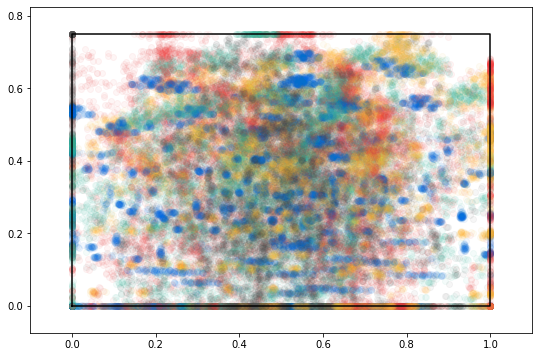

In [55]:
color_dic = {
    "rest": "#046DE0",
    "punching": "#FDBE3D",
    "ROTS": "#38B99E",
    "squats": "#515151",
    "star_jumps": "#f14040",
}
fig, ax = plt.subplots(1,1)
fig.set_size_inches((9,6))
data = X_train_augemented
for i in range(0, data.shape[0], int(data.shape[0]/100)):
    action = y_train_augemented[i]
    plt.scatter(data[i][:,:,1], data[i][:,:,0], c=color_dic[action], alpha=0.05 )
ax.set_xlim((-0.1,1.1))
ax.set_ylim((-0.1 * 48/64, 1.1* 48/64))

# draw box
ax.plot([-0,-0,1,1,-0],[-0, 0.75, 0.75, -0, -0], c='k');

((min, min), (max, max)): 
(( 0.0 ,  0.25215642739826605 ), ( 0.5838294785310323 ,  0.6252234928338909 ))
((min, min), (max, max)): 
(( 0.0 ,  0.11674627209451875 ), ( 0.5740617464952431 ,  0.6341047667343793 ))
((min, min), (max, max)): 
(( 0.0 ,  0.2611932179343376 ), ( 0.6022005452256258 ,  0.6439978529043235 ))
((min, min), (max, max)): 
(( 0.0 ,  0.12368166284338508 ), ( 0.5930345624337401 ,  0.6603957521312431 ))
((min, min), (max, max)): 
(( 0.0 ,  0.09362383853600646 ), ( 0.6271747234730405 ,  0.8791199908646166 ))


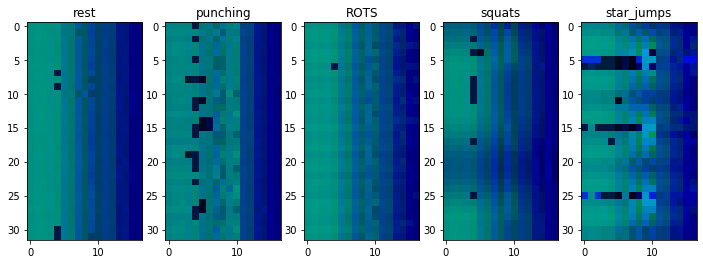

In [56]:
test_indices = [0, 350, 700, 1050, 1400]

fig, ax = plt.subplots(1, len(test_indices))
fig.set_size_inches((12,6))
for i in range(len(test_indices)):
    test_action = X_train_flipped[test_indices[i]]
    # test_action = (test_action + (image_size / (image_size.max()))) / 2
    test_image = np.zeros((32,17,3))
    test_image[:,:,1:3] = test_action
    
    #test_image =clip_image(test_image)

    #print("min: ", test_image.min(), "max :", test_image.max())
    print(
        "((min, min), (max, max)): \n((",
        test_action[:,:,0].min(),", ", test_action[:,:,1].min(), "), (",
        test_action[:,:,0].max(),", ", test_action[:,:,1].max(), "))"
    )
    
    ax[i].imshow(test_image)
    ax[i].set_title(y_train[test_indices[i]]);

((min, min), (max, max)): 
(( 0.0 ,  0.31076746518897325 ), ( 0.5938345353110543 ,  0.6574919915559241 ))
((min, min), (max, max)): 
(( 0.0 ,  0.44841015751602314 ), ( 0.6519915039542108 ,  0.9055587907194098 ))
((min, min), (max, max)): 
(( 0.0 ,  0.15089281790461478 ), ( 0.6917597123834276 ,  0.5360435019607772 ))
((min, min), (max, max)): 
(( 0.0 ,  0.1713544375698966 ), ( 0.7429286527143565 ,  0.7148884387689091 ))
((min, min), (max, max)): 
(( 0.0 ,  0.19813330360775833 ), ( 0.5568921044221387 ,  0.9432241608387639 ))


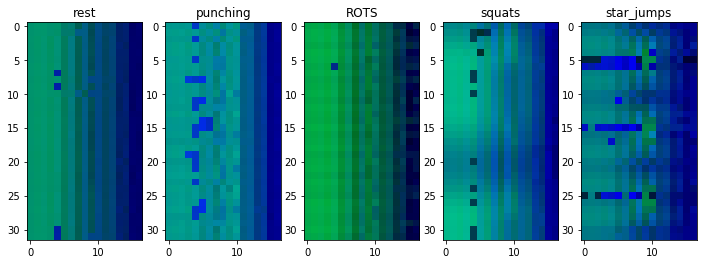

In [57]:
test_indices = [0, 350, 700, 1051, 1400]

fig, ax = plt.subplots(1, len(test_indices))
fig.set_size_inches((12,6))
for i in range(len(test_indices)):
    test_action = X_train_augemented[test_indices[i]]
    # test_action = (test_action + (image_size / (image_size.max()))) / 2
    test_image = np.zeros((32,17,3))
    test_image[:,:,1:3] = test_action

    print(
        "((min, min), (max, max)): \n((",
        test_action[:,:,0].min(),", ", test_action[:,:,1].min(), "), (",
        test_action[:,:,0].max(),", ", test_action[:,:,1].max(), "))"
    )
    
    ax[i].imshow(test_image)
    ax[i].set_title(y_train_augemented[test_indices[i]]);

((min, min), (max, max)): 
(( 0.0 ,  0.25980037288443125 ), ( 0.5835861983466242 ,  0.6161574714378625 ))
((min, min), (max, max)): 
(( 0.0 ,  0.11946626117721142 ), ( 0.5583878851818204 ,  0.860837291650735 ))
((min, min), (max, max)): 
(( 0.0 ,  0.1177739971806567 ), ( 0.6002284849664117 ,  0.6171555495911536 ))
((min, min), (max, max)): 
(( 0.0 ,  0.25025081530155374 ), ( 0.5760209662441149 ,  0.6304880737794513 ))
((min, min), (max, max)): 
(( 0.0 ,  0.09895695972071547 ), ( 0.6213254817265017 ,  0.8061883681479131 ))


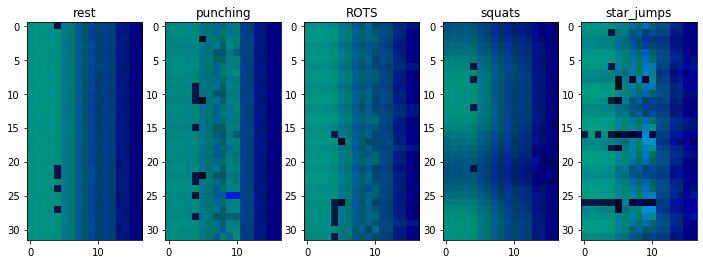

In [59]:
test_indices = [0, 100, 200, 300, 400]

fig, ax = plt.subplots(1, len(test_indices))
fig.set_size_inches((12,6))
for i in range(len(test_indices)):
    test_action = X_test_flipped[test_indices[i]]
    # test_action = (test_action + (image_size / (image_size.max()))) / 2
    test_image = np.zeros((32,17,3))
    test_image[:,:,1:3] = test_action

    print(
        "((min, min), (max, max)): \n((",
        test_action[:,:,0].min(),", ", test_action[:,:,1].min(), "), (",
        test_action[:,:,0].max(),", ", test_action[:,:,1].max(), "))"
    )
    
    ax[i].imshow(test_image)
    ax[i].set_title(y_test[test_indices[i]]);

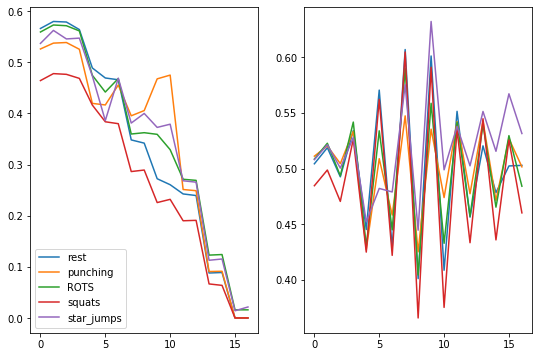

In [60]:
test_indices = [0, 100, 200, 300, 400]
fig, ax = plt.subplots(1,2)
fig.set_size_inches((9,6))
labels = []
for i in range(len(test_indices)):
    y = X_test_flipped[test_indices[i]].mean(axis=0)
    ax[0].plot(range(len(y)), y[:,0])
    ax[1].plot(range(len(y)), y[:,1])
    labels.append(y_test[test_indices[i]])
ax[0].legend(labels)

In [74]:
# create onehot encoding of y_train_augemented and y_test_augemented
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(handle_unknown='error', sparse=False)
y_train_one_hot = encoder.fit_transform(np.array(y_train_augemented).reshape((-1,1)))
y_test_one_hot = encoder.transform(np.array(y_test_augemented).reshape((-1,1)))


In [78]:
from sklearn.utils import shuffle
X_train_augemented, y_train_one_hot = shuffle(X_train_augemented, y_train_one_hot, random_state=seed)
y_train_one_hot[:10,:]

array([[1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.]])

In [62]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten

In [138]:
model = Sequential()
model.add(Flatten(input_shape=X_train_augemented.shape[1:]))

model.add(Dense(64))
model.add(Activation('relu'))

# model.add(Dense(64))
# model.add(Activation('relu'))

model.add(Dense(5))
model.add(Activation('softmax'))

model.compile(loss = 'categorical_crossentropy', optimizer= 'adam', metrics = ['accuracy'])
model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_9 (Flatten)          (None, 1088)              0         
_________________________________________________________________
dense_20 (Dense)             (None, 64)                69696     
_________________________________________________________________
activation_20 (Activation)   (None, 64)                0         
_________________________________________________________________
dense_21 (Dense)             (None, 5)                 325       
_________________________________________________________________
activation_21 (Activation)   (None, 5)                 0         
Total params: 70,021
Trainable params: 70,021
Non-trainable params: 0
_________________________________________________________________


In [139]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping
es = EarlyStopping(
    monitor='val_loss', 
    mode='min', 
    patience=100, 
    verbose=1, 
    restore_best_weights=True
    ) 

history = model.fit(X_train_augemented, y_train_one_hot, batch_size = 8192, epochs = 600, validation_split = 0.2, callbacks=[es])

ccuracy: 0.9995
Epoch 461/600
7/7 [==============================] - 0s 51ms/step - loss: 0.0019 - accuracy: 0.9999 - val_loss: 0.0036 - val_accuracy: 0.9995
Epoch 462/600
7/7 [==============================] - 0s 50ms/step - loss: 0.0019 - accuracy: 0.9999 - val_loss: 0.0036 - val_accuracy: 0.9995
Epoch 463/600
7/7 [==============================] - 0s 51ms/step - loss: 0.0019 - accuracy: 0.9999 - val_loss: 0.0036 - val_accuracy: 0.9995
Epoch 464/600
7/7 [==============================] - 0s 46ms/step - loss: 0.0018 - accuracy: 0.9999 - val_loss: 0.0036 - val_accuracy: 0.9995
Epoch 465/600
7/7 [==============================] - 0s 46ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 0.0036 - val_accuracy: 0.9995
Epoch 466/600
7/7 [==============================] - 0s 59ms/step - loss: 0.0018 - accuracy: 0.9999 - val_loss: 0.0036 - val_accuracy: 0.9995
Epoch 467/600
7/7 [==============================] - 0s 62ms/step - loss: 0.0018 - accuracy: 0.9999 - val_loss: 0.0035 - val_accurac

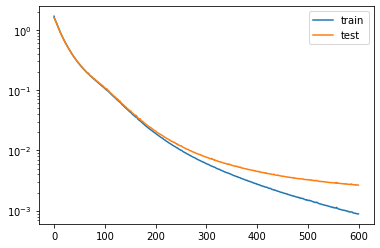

In [140]:
# plot training history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')

# baseline = 0.25252519405266327 # linear model
# plt.plot([0,1000],[baseline**2, baseline**2])

# baseline = 0.2163232816813099 # taking previous days
# plt.plot([0,1000],[baseline**2, baseline**2])

plt.legend()
plt.yscale('log')
plt.show()

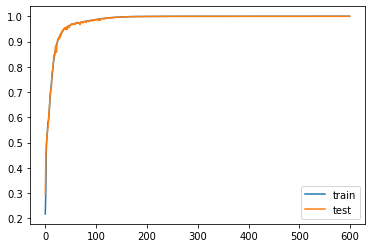

In [141]:
# plot training history
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='test')

# baseline = 0.25252519405266327 # linear model
# plt.plot([0,1000],[baseline**2, baseline**2])

# baseline = 0.2163232816813099 # taking previous days
# plt.plot([0,1000],[baseline**2, baseline**2])

plt.legend()
plt.yscale('linear')
plt.show()

In [143]:
val_loss, val_acc = model.evaluate(X_test_augemented, y_test_one_hot) # evaluate the out of sample data with model
print(val_loss) # model's loss (error)
print(val_acc) # model's accuracy

544/544 [==============================] - 0s 800us/step - loss: 0.1185 - accuracy: 0.9528
0.1185264140367508
0.9527586102485657


In [152]:
print("test accuracy: ", 
model.evaluate(X_test_flipped, encoder.transform(np.array(y_test).reshape((-1,1)))))
print("augemented test accuracy: ", model.evaluate(X_test_augemented, encoder.transform(np.array(y_test_augemented).reshape((-1,1)))))

14/14 [==============================] - 0s 1ms/step - loss: 0.1158 - accuracy: 0.9563
test accuracy:  [0.11580013483762741, 0.9563218355178833]
544/544 [==============================] - 0s 918us/step - loss: 0.1185 - accuracy: 0.9528
augemented test accuracy:  [0.1185264140367508, 0.9527586102485657]


In [146]:
from sklearn.metrics import confusion_matrix

conf_mat = confusion_matrix(np.argmax(y_test_one_hot, axis=1), np.argmax(model.predict(X_test_not_augemented), axis=1))
conf_mat

array([[3476,    0,    0,    0,    4],
       [   0, 3479,    0,    0,    1],
       [   0,    0, 3480,    0,    0],
       [   0,    0,  814, 2666,    0],
       [   3,    0,    0,    0, 3477]], dtype=int64)

In [162]:
X_test_preprocess_test = preprocess_ndarray(np.array(X_test))
y_test_preprocess_test = encoder.transform(np.array(y_test).reshape((-1,1)))
model.evaluate(X_test_preprocess_test, y_test_preprocess_test)

14/14 [==============================] - 0s 929us/step - loss: 0.1158 - accuracy: 0.9563


[0.11580013483762741, 0.9563218355178833]

In [175]:
models_path = 'models'
_name = 'actionnet_dense_model_10_fps.h5'
model_path = os.path.join(models_path,f_name)
model.save(model_path)

In [176]:
import pickle
import marshal

In [184]:
models_path = 'models'
f_name = 'actionnet_dense_preprocess_and_model_10_fps.pickle'
f_path = os.path.join(models_path,f_name)

classes_list = list(encoder.categories_[0])

code_string = marshal.dumps(preprocess_ndarray.__code__)
data = {
    "preprocess_function": code_string, 
    "model_path": model_path,
    "classes_list": classes_list
}
with open(f_path, "wb") as f:
    pickle.dump(data, f)

In [182]:
list(encoder.categories_[0])

['ROTS', 'punching', 'rest', 'squats', 'star_jumps']